In [2]:
# Importing all the required imports

#from google.colab import files
#uploaded = files.upload()
from google.colab import drive
drive.mount('/content/drive')

# Removing Warnings
import warnings
warnings.filterwarnings('ignore') #Ignoring the warning messages

from PIL import Image
import os
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from sklearn.preprocessing import LabelEncoder
from skimage.transform import resize

from sklearn.manifold import TSNE
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import MDS
from scipy.spatial import procrustes
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Mounted at /content/drive


In [4]:
import zipfile

# Path to the zip file in your Google Drive (adjust the path accordingly)
google_drive_zip_path = '/content/drive/MyDrive/Colab Notebooks/360 Rocks.zip'

# Define the target directory to extract the contents
target_directory = '/content/extracted_images/'

# Create the target directory if it doesn't exist
!mkdir -p {target_directory}

# Extract the contents of the zip file
with zipfile.ZipFile(google_drive_zip_path, 'r') as zip_ref:
   zip_ref.extractall(target_directory)

In [5]:
# Specify the folder path
folder_path = './extracted_images'
#folder_path = '/Users/malhardhopate/Desktop/IUB/Fall 2023/Applied Machine Learning/HW3/Q1/Data/360 Rocks'

# Initialize a list to store the image data
images = []

# Loop through the files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Open and load the image
        img = Image.open(os.path.join(folder_path, filename))
        new_size = (img.width // 2, img.height // 2)
        #resized_img = img.resize(new_size, Image.ANTIALIAS)
        resized_img = img.resize(new_size)
        # Convert the image to a numpy array
        img_data = np.array(resized_img)
        # Flatten the image into a 1D vector and append to the list
        images.append(img_data)

# 'images' now contains a list of flattened image data

In [6]:
# Flatten the 4D array into a 2D array (num_images, num_features)
images = np.stack(images) # Stacking the 'images' list along a new axis to create a new array
print(f"Original 'images' shape is: {images.shape}")
print("*"*100)

# Determining the Height, Width & Channels for rehaping the 'images' list
num_samples, height, width, channels = images.shape
images = images.reshape(num_samples, height * width * channels)
print(f"New shape for 'images' shape is: {images.shape}")
print("*"*100)

Original 'images' shape is: (360, 400, 400, 3)
****************************************************************************************************
New shape for 'images' shape is: (360, 480000)
****************************************************************************************************


# **Question 1: Apply PCA to the images from folder '360 Rocks'. How many components do you need to preserve 95% of the variance?**

In [7]:
# Implementing PCA
pca = PCA()
pca.fit(images)

# Finding the number of Components required to preserve 95% of the variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_95_variance = np.argmax(cumulative_explained_variance >= 0.95) + 1

print(f"Number of components needed to preserve 95% of variance: {n_components_95_variance}")

Number of components needed to preserve 95% of variance: 222


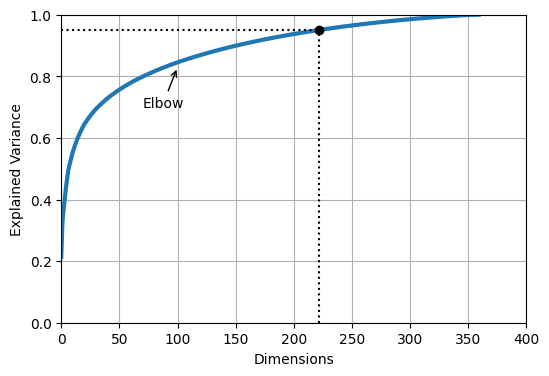

In [8]:
# extra code – this cell generates saves the Figure to represent the number of components needs to preserve 95% variance
plt.figure(figsize=(6, 4))
plt.plot(cumulative_explained_variance, linewidth=3)
plt.axis([0, 400, 0, 1])

# Adding Lables to Axis
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")

# Plotting Dotted line for the point
plt.plot([n_components_95_variance, n_components_95_variance], [0, 0.95], "k:")
plt.plot([0, n_components_95_variance], [0.95, 0.95], "k:")
plt.plot(n_components_95_variance, 0.95, "ko")
plt.annotate("Elbow", xy=(100, 0.83), xytext=(70, 0.7),
             arrowprops=dict(arrowstyle="->"))
plt.grid(True)
plt.show()

<H2>As seen from above, along with the figure, we can observe that the number of required components to preserve 95% variance is - 222.</H2>


<H1>Question 2</H1>

<H2>Plot 10 images of your choice in the original form (without PCA) and then plot their reconstruction (projection in the original space) after you kept 95% of variance using PCA.</H2>

In [9]:
# Checking the shape of the 'images' list
images.shape

(360, 480000)

In [10]:
# Transforming the images while saving 95% of the variance
pca = PCA(0.95)
X_reduced = pca.fit_transform(images)
print(f"The shape of the reduced images is: {X_reduced.shape}")

The shape of the reduced images is: (360, 222)


In [11]:
# Recovering and Reshaping the recovered images back to (num_images, height, width, channels)
X_recovered = pca.inverse_transform(X_reduced)
X_recovered = X_recovered.reshape(num_samples, height,width,channels)
print(f"The shape of the recovered images is: {X_recovered.shape}")

The shape of the recovered images is: (360, 400, 400, 3)


In [12]:
X_recovered[1].shape

(400, 400, 3)

In [13]:
# Reshaping the 'images' to the original shape
images = images.reshape(num_samples, height,width,channels)
print(f"The shape of the reshaped original images is: {images.shape}")

The shape of the reshaped original images is: (360, 400, 400, 3)


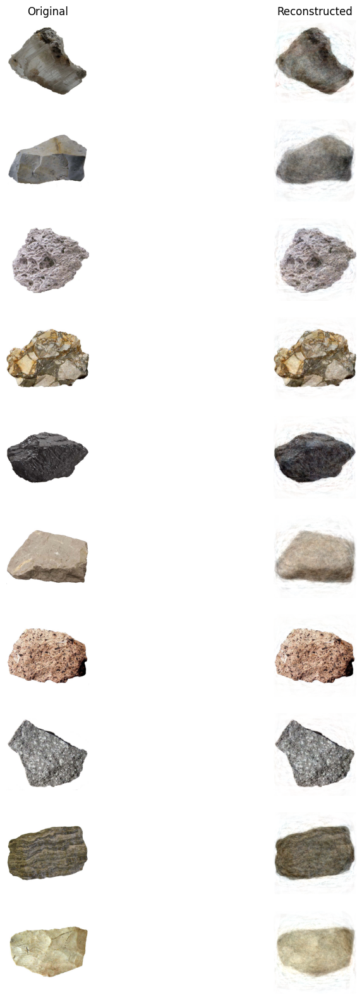

In [14]:
# Number of images to plot
num_images_to_plot = 10

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(num_images_to_plot, 2, figsize=(10, 20))
axes[0, 0].set_title("Original")
axes[0, 1].set_title("Reconstructed")
for i in range(num_images_to_plot):
    # Original image
    original_image = images[i].reshape(400, 400, 3)
    axes[i, 0].imshow(original_image.astype(int))
    axes[i, 0].axis("off")

    # Reconstructed image
    reconstructed_image = X_recovered[i].reshape(400, 400, 3)
    axes[i, 1].imshow(reconstructed_image.astype(int))
    axes[i, 1].axis("off")

plt.show()

<H3>The abover figure plots the original figures again the recovered images after saving 95% of the Variance.</H3>

<H1>Question 3</H1>

<H2>Each of the images belongs to one of three rock categories. The category is indicated by the first letter in the filename (I, M and S). We will now try to see if the visualization can help us identify different clusters.</H2>

In [15]:
# Checking the shape of the 'images' variable
images.shape

(360, 400, 400, 3)

In [16]:
# Extracting the category information from the filenames
categories = [filename[0] for filename in os.listdir(folder_path)]

# Counting the occurrences of every lable in the list
for c in np.unique(categories):
    #categories.count("I")
    # Print the result
    print(f'The lable {c} occurs {categories.count(c)} times in the list.')

The lable I occurs 120 times in the list.
The lable M occurs 120 times in the list.
The lable S occurs 120 times in the list.


<H2>(A): Use PCA to reduce dimensionality to only 2 dimensions. How much of the variance is explained with the first two principal components?</H2>

In [17]:
# Implementing PCA while keeping only 2 components
pca = PCA(n_components=2)
%time X2D = pca.fit_transform(images.reshape(num_samples, height * width * channels))

print(f"\nVariance explained by each on the 2 principle components that were kept is: \n\t {pca.explained_variance_ratio_}")
print(f"\n\tThe variance explained by the 1st dimension is: {round(pca.explained_variance_ratio_[0],2)*100}%")
print(f"\tThe variance explained by the 2nd dimension is: {round(pca.explained_variance_ratio_[1],2)*100}%")

print(f"\nThe total variance explained by the 2 principle components is: {round(sum(pca.explained_variance_ratio_),2)*100}%")
print(f"The variance LOST by keeping only 2 principle components is: {round(1-sum(pca.explained_variance_ratio_),2)*100}%")

CPU times: user 18.7 s, sys: 1.69 s, total: 20.4 s
Wall time: 11.2 s

Variance explained by each on the 2 principle components that were kept is: 
	 [0.21400659 0.11368477]

	The variance explained by the 1st dimension is: 21.0%
	The variance explained by the 2nd dimension is: 11.0%

The total variance explained by the 2 principle components is: 33.0%
The variance LOST by keeping only 2 principle components is: 67.0%


<H2>(B): Plot a 2D scatter plot of the images spanned by the first two principal components. Each image will be represented with a dot. Make the color of the dot correspond to the image category (so you will have three different colors). Then add some rock images to the visualization to better understand what features in the images are accounting for the majority of variance in the data (your visualization should look similar to the one after line 71 in this file https://github.com/ageron/handson-ml3/blob/main/08_dimensionality_reduction.ipynbLinks to an external site. but with images of rocks instead of MNIST digits). Repeat the process and create the same type of plots for t-SNE, LLE and MDS.</H2>

<H2>PCA Plot</H2>

Default Colormap: viridis


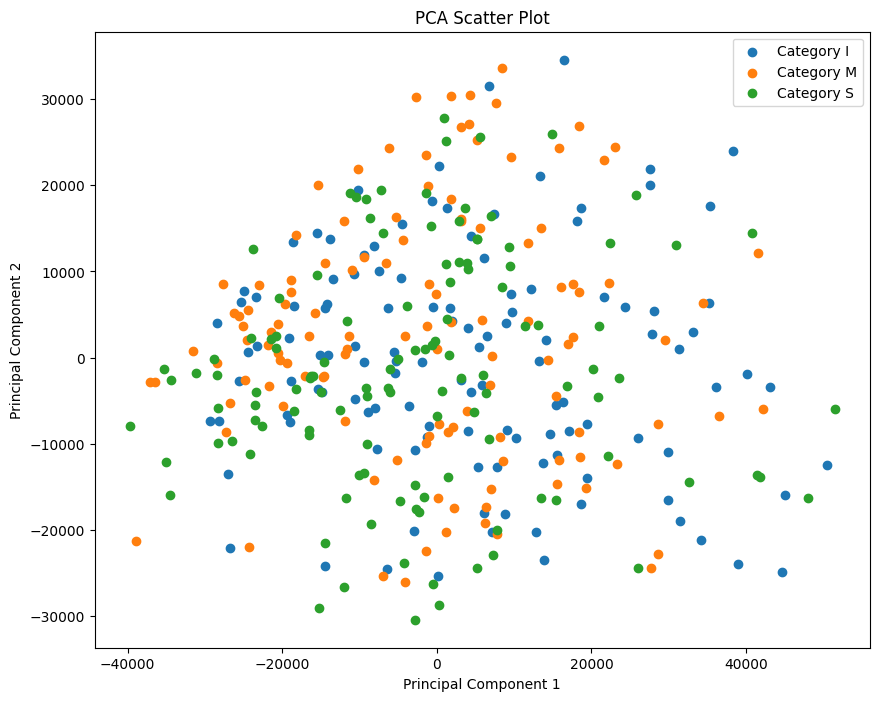

In [18]:
from matplotlib.cm import get_cmap
# Create a scatter plot with the 2 principle components
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X2D[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], label=f'Category {category}')
    # Getting the default 'cmap' assigned by mat plt
    default_cmap = get_cmap()

# Print the name of the default colormap
print("Default Colormap:", default_cmap.name)

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

<H2>Plot with Rock Image as Lables</H2>

In [19]:
# Creating a function to plot rock images on the graph
def plot_rocks(X, rock_categories, min_distance=0.04, rock_images=None, figsize=(13, 10),image_size=(50,50)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the rocks plotted so far.
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet

    label_encoder = LabelEncoder()
    encoded_rock_categories = label_encoder.fit_transform(rock_categories)

    unique_rock_categories = np.unique(encoded_rock_categories)
    for category in unique_rock_categories:
        category_indices = np.where(encoded_rock_categories == category)
        category_images = X_normalized[category_indices]
        plt.scatter(category_images[:, 0], category_images[:, 1],
                    cmap="binary",
                    s=200, label="Category "+label_encoder.inverse_transform([category])[0])

    #Adding Legend
    plt.legend(fontsize=25, loc='best')

    plt.axis("off")
    ax = plt.gca()  # get current axes

    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if rock_images is None:
                category_label = label_encoder.inverse_transform([encoded_rock_categories[index]])[0]
                plt.text(image_coord[0], image_coord[1], str(category_label),
                         cmap="binary",
                         fontdict={"weight": "bold", "size": 16})
            else:
                rock_image = rock_images[index].reshape(400, 400, 3)
                rock_image = resize(rock_image, image_size, anti_aliasing=True)
                imagebox = AnnotationBbox(OffsetImage(rock_image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)


Text(0.5, 1.0, 'PCA Plot with Rock Images')

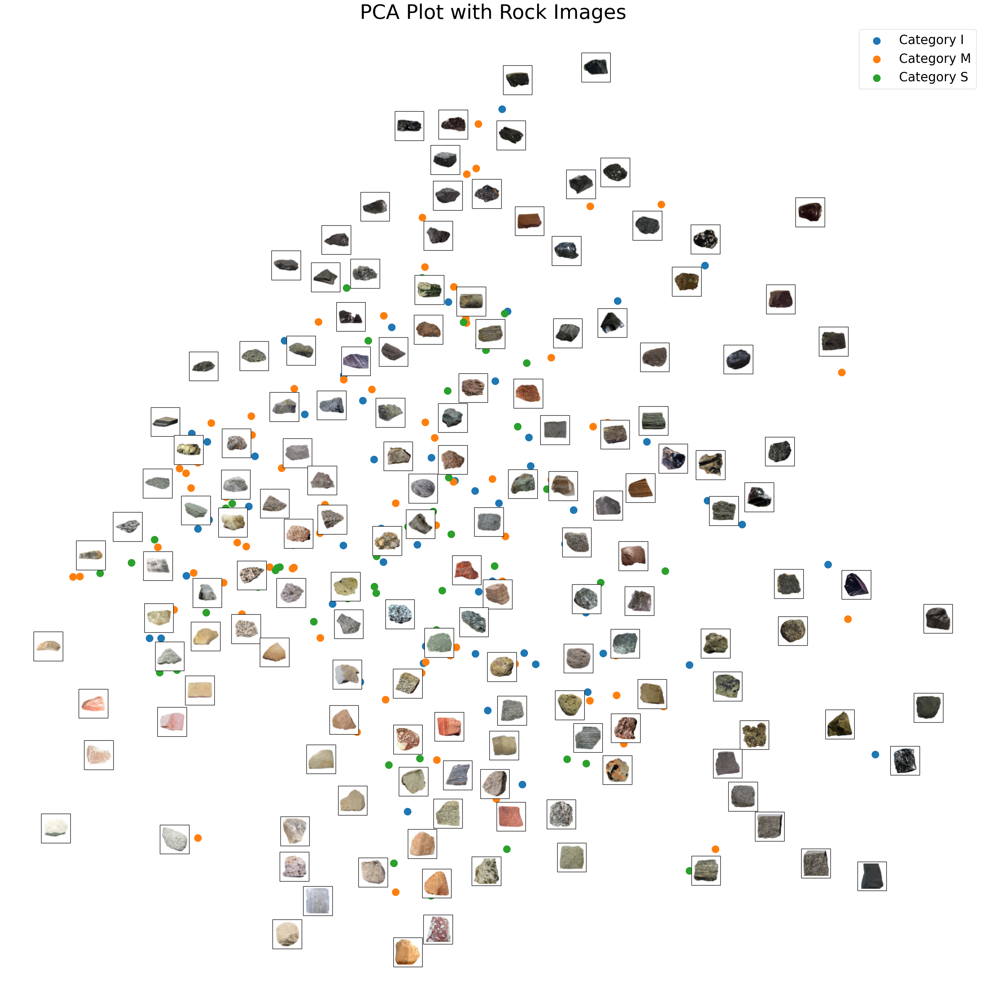

In [20]:
# Plotting the required plot
plot_rocks(X2D,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('PCA Plot with Rock Images', fontsize=40)

<H2>T-SNE Plot</H2>

CPU times: user 20.5 s, sys: 4.4 s, total: 24.9 s
Wall time: 17.7 s


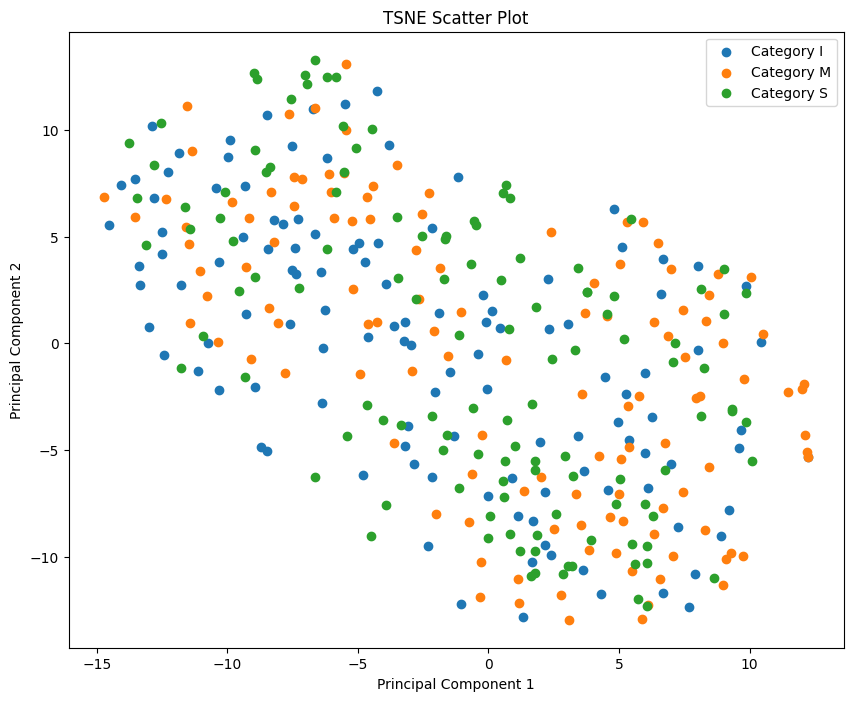

In [21]:
# Perform t-SNE to reduce the data to 2 dimensions
tsne = TSNE(n_components=2, random_state=0)
%time X_tsne = tsne.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_tsne[np.array(categories) == category]
    #plt.scatter(category_images[:, 0], category_images[:, 1], c=color, label=f'Category {category}')
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('TSNE Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

Text(0.5, 1.0, 'T-SNE Plot with Rock Images')

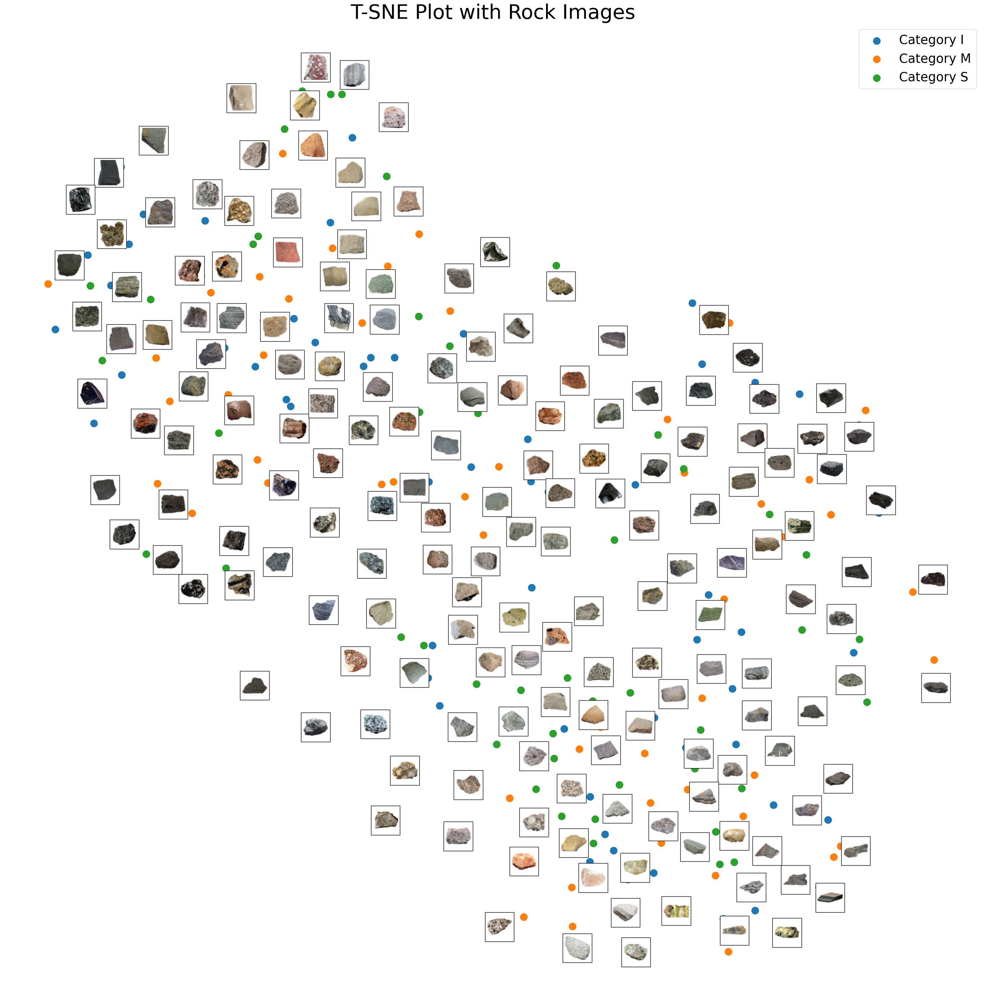

In [22]:
# Plotting the required plot
plot_rocks(X_tsne,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('T-SNE Plot with Rock Images', fontsize=40)

<H2>LLE Plot</H2>

CPU times: user 11.5 s, sys: 413 ms, total: 11.9 s
Wall time: 10.1 s


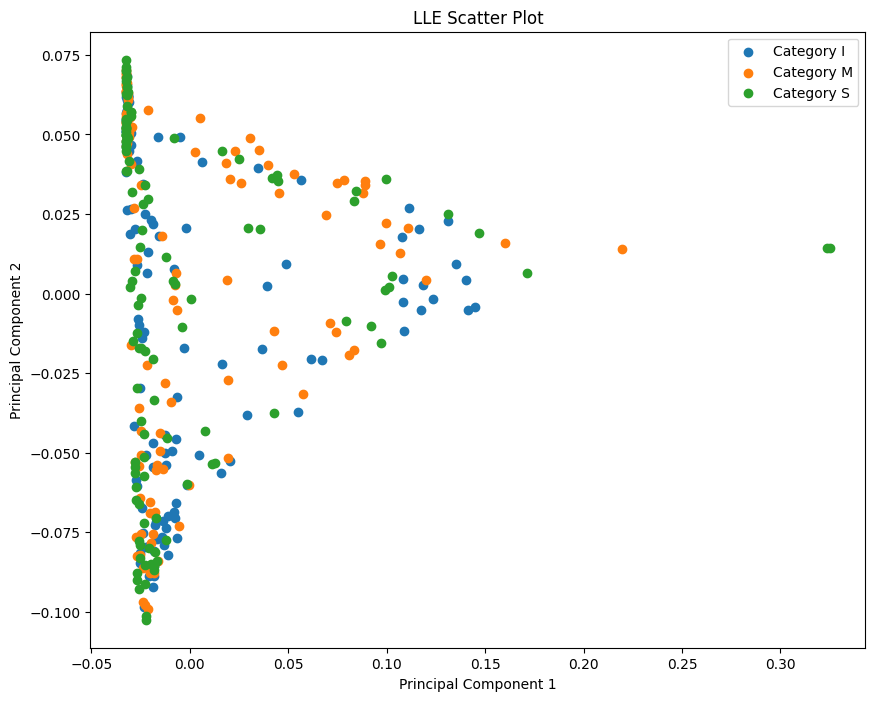

In [23]:
# Perform LLE to reduce the data to 2 dimensions
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=5, random_state=0)
%time X_lle = lle.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_lle[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('LLE Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'LLE Plot with Rock Images')

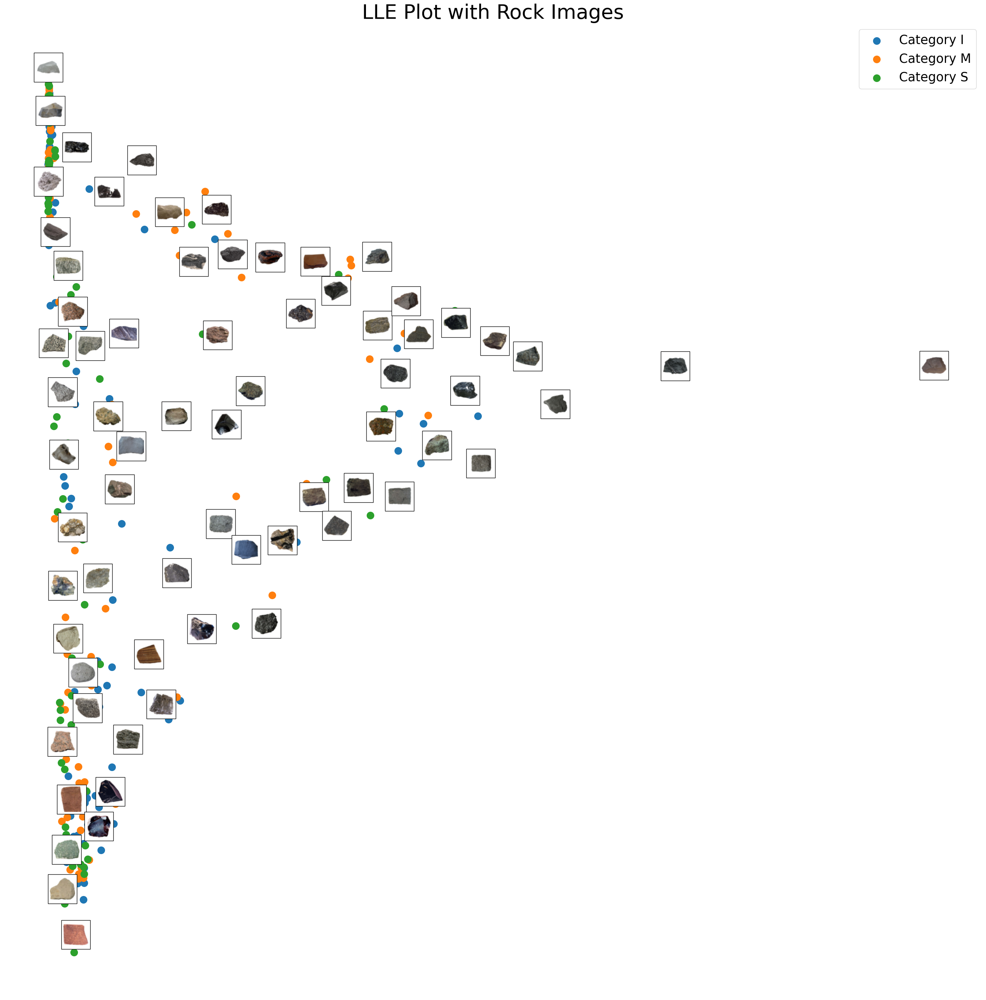

In [24]:
# Plotting the required plot
plot_rocks(X_lle,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('LLE Plot with Rock Images', fontsize=40)

<H2>MDS Plot</H2>

CPU times: user 6.61 s, sys: 2.45 s, total: 9.06 s
Wall time: 4.99 s


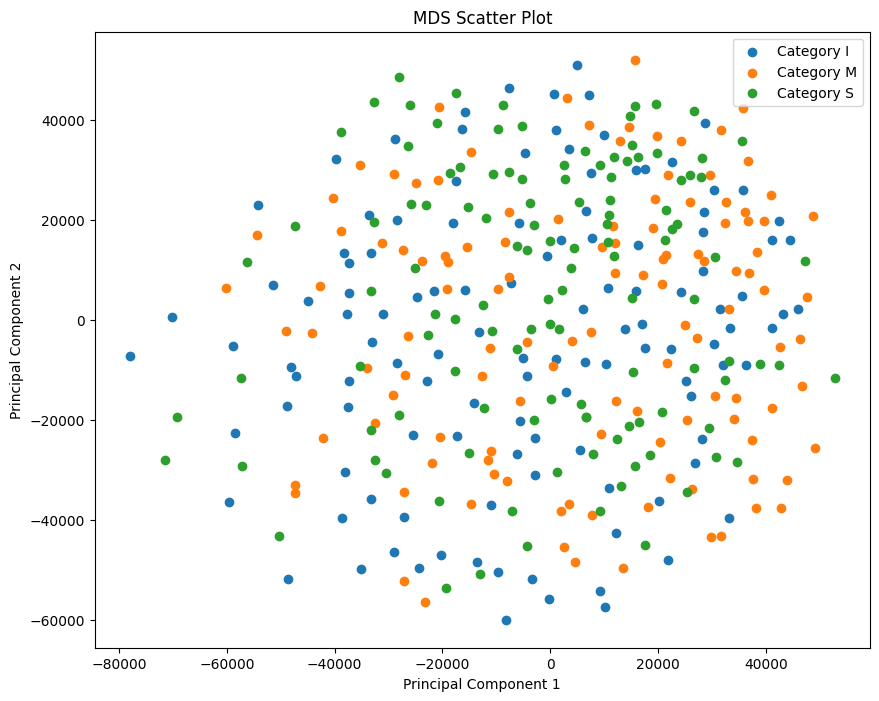

In [25]:
# Perform MDS to reduce the data to 2 dimensions
mds = MDS(n_components=2, random_state=0)
%time X_mds = mds.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_mds[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('MDS Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'MDS Plot with Rock Images')

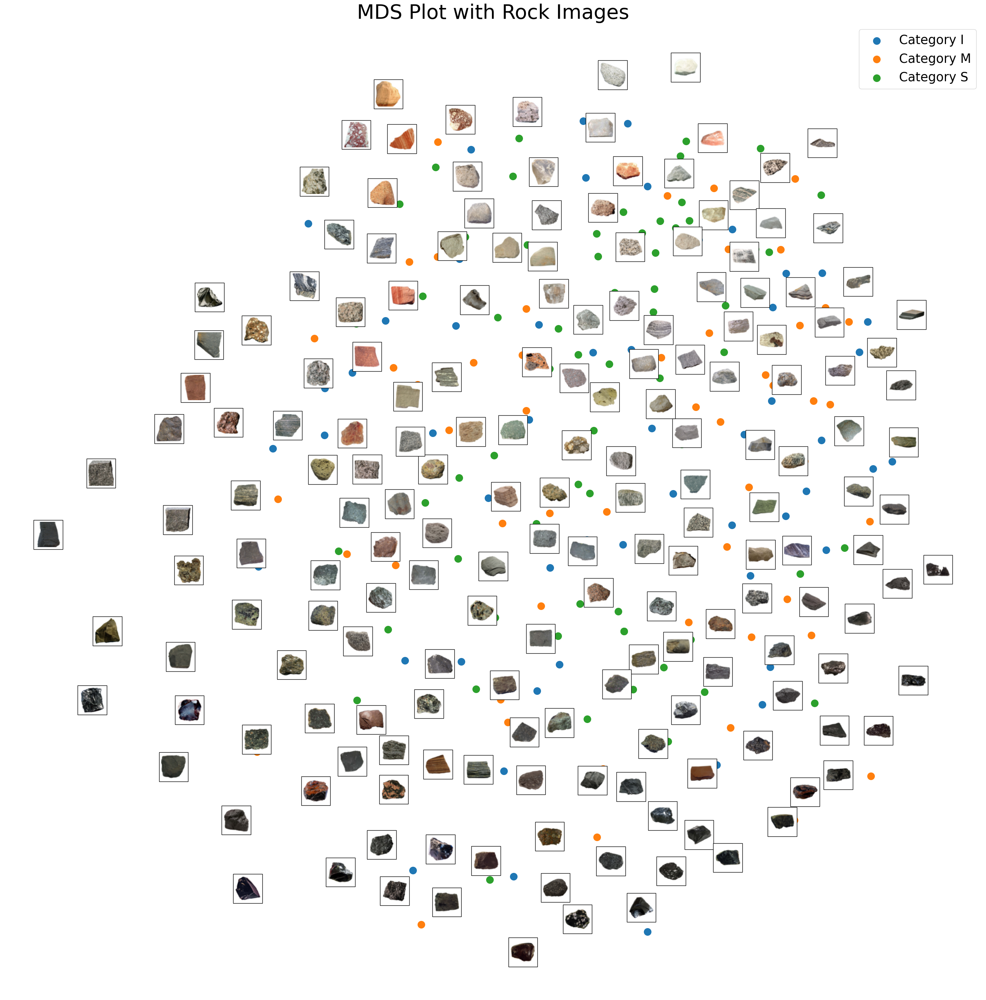

In [26]:
# Plotting the required plot
plot_rocks(X_mds,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('MDS Plot with Rock Images', fontsize=40)


<H2>(C): Which of the visualizations do you prefer?</H2>

<H2>Answer - <br>

- MDS has the smallest total CPU time of 9.42 seconds, followed by LLE, and PCA runtimes.
- T-SNE had the longest CPU time of 1 minute 3 seconds.
- None of the above visualizations do a good job of explaining the data clusters, as the data is very dispersed in PCA, T-SNE & MDS, where as it is highly overlapped in the LLE visual.
- The data might be well clustered in a higher dimension, compared to the 2-dimension plots.
 </H2>

<H2>Question 4</H2>

<H2>Now let's see if these dimensionality reduction techniques can give us similar features to those that humans use to judge the images. File mds_360.txt contains 8 features for each of the images (rankings are in the same order as the images in  '360 Rocks' folder. Run PCA, t-SNE, LLE and MDS to reduce the dimensionality of the images to 8. Then, compare those image embeddings with the ones from humans that are in the mds_360.txt file. Use Procrustes analysis to do the comparison (here is one example of how to do that mtx1, mtx2, disparity = procrustes(matrix_with_human_data, matrix_with_pca_embeddings_data). Here matrix_with_human_data and matrix_with_pca_embeddings_data should be 360 by 8. disparity will tell you the difference in the data. Report disparity for each of the four dimensionality reduction methods. Compute the correlation coefficient between each dimension of mtx1 and mtx2 for each of the four methods - display results in a table.</H2>

In [27]:
# Importing the data from mds_360.txt file
human_data = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/mds_360.txt')
#human_data = np.loadtxt('/Users/malhardhopate/Desktop/IUB/Fall 2023/Applied Machine Learning/HW3/Q1/Data/mds_360.txt')
human_data

array([[-3.743, -1.204,  2.001, ..., -1.992,  4.95 ,  1.695],
       [ 2.332,  1.625,  0.985, ...,  0.093,  6.724,  0.708],
       [ 0.346,  1.49 , -3.795, ..., -3.786,  0.706, -2.854],
       ...,
       [-3.475, -3.431, -2.184, ..., -2.265,  1.129, -1.201],
       [-0.051, -2.358,  1.994, ...,  7.268, -0.593, -1.432],
       [ 1.134, -4.9  ,  0.983, ...,  4.695,  0.624, -1.195]])

In [28]:
# Reducing the images to 8 dimensions using PCA, T-SNE, LLE, & MDS
pca_8 = PCA(n_components = 8)
X_pca_reduced_8 = pca_8.fit_transform(images.reshape(num_samples, height * width * channels))

tsne_8 = TSNE(n_components=8,method='exact', random_state=0)
X_tsne_reduced_8 = tsne_8.fit_transform(images.reshape(num_samples, height * width * channels))

lle_8 = LocallyLinearEmbedding(n_components=8, n_neighbors=5, random_state=0)
X_lle_reduced_8 = lle_8.fit_transform(images.reshape(num_samples, height * width * channels))

mds_8 = MDS(n_components=8, random_state=0)
X_mds_reduced_8 = mds_8.fit_transform(images.reshape(num_samples, height * width * channels))

In [29]:
# Shapes of all the datasets
print(f"The shape of human_data is {human_data.shape}")
print(f"The shape of PCA reduced images to 8 dimensions is {X_pca_reduced_8.shape}")
print(f"The shape of T-SNE reduced images to 8 dimensions is {X_tsne_reduced_8.shape}")
print(f"The shape of LLE reduced images to 8 dimensions is {X_lle_reduced_8.shape}")
print(f"The shape of MDS reduced images to 8 dimensions is {X_mds_reduced_8.shape}")

The shape of human_data is (360, 8)
The shape of PCA reduced images to 8 dimensions is (360, 8)
The shape of T-SNE reduced images to 8 dimensions is (360, 8)
The shape of LLE reduced images to 8 dimensions is (360, 8)
The shape of MDS reduced images to 8 dimensions is (360, 8)


<H2>PCA</H2>

In [30]:
pd.set_option('display.expand_frame_repr', False)  # Prevent line wrapping
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows

# Making a List of Features
hd = []
for r in range(0,8):
  H = "Feature " + str(r+1)
  hd.append(H)

# Making Matrixes
mtx1, mtx2, disparity = procrustes(human_data, X_pca_reduced_8)

# Converting human_data & PCA reduced data into dataframes, with headers
mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(X_pca_reduced_8,columns = hd)

# PCA
correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between PCA (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & PCA is - ")
print(df)



Disparity between PCA (8 features) to human data is: 0.9845

The Correlation between human_data & PCA is - 
    Features  Correlation
0  Feature 1      -0.0130
1  Feature 2       0.0447
2  Feature 3       0.0131
3  Feature 4       0.1213
4  Feature 5       0.0210
5  Feature 6      -0.0750
6  Feature 7       0.0246
7  Feature 8      -0.0296


<H2>T-SNE</H2>

In [31]:
# Making Matrixes
mtx1, mtx2, disparity = procrustes(human_data, X_tsne_reduced_8)

# Converting human_data & T-SNE reduced data into dataframes, with headers
mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(X_tsne_reduced_8,columns = hd)

# T-SNE
correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between T-SNE (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & TSNE is - ")
print(df)



Disparity between T-SNE (8 features) to human data is: 0.9889

The Correlation between human_data & TSNE is - 
    Features  Correlation
0  Feature 1      -0.0087
1  Feature 2       0.0801
2  Feature 3       0.1096
3  Feature 4       0.0246
4  Feature 5       0.0416
5  Feature 6      -0.0050
6  Feature 7       0.0700
7  Feature 8       0.0123


<H2>LLE</H2>

In [32]:
# Making Matrixes
mtx1, mtx2, disparity = procrustes(human_data, X_lle_reduced_8)

# Converting human_data & LLE reduced data into dataframes, with headers
mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(X_lle_reduced_8,columns = hd)

# LLE
correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between LLE (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & LLE is - ")
print(df)



Disparity between LLE (8 features) to human data is: 0.9863

The Correlation between human_data & LLE is - 
    Features  Correlation
0  Feature 1       0.0661
1  Feature 2      -0.0473
2  Feature 3      -0.0362
3  Feature 4      -0.0014
4  Feature 5      -0.0449
5  Feature 6      -0.0425
6  Feature 7       0.0284
7  Feature 8      -0.0480


<H2>MDS</H2>

In [33]:
# Making Matrixes
mtx1, mtx2, disparity = procrustes(human_data, X_mds_reduced_8)

# Converting human_data & LLE reduced data into dataframes, with headers
mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(X_mds_reduced_8,columns = hd)

# MDS
correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between MDS (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & MDS is - ")
print(df)



Disparity between MDS (8 features) to human data is: 0.9853

The Correlation between human_data & MDS is - 
    Features  Correlation
0  Feature 1      -0.0220
1  Feature 2      -0.0090
2  Feature 3      -0.0369
3  Feature 4       0.0354
4  Feature 5      -0.0474
5  Feature 6       0.0764
6  Feature 7       0.0332
7  Feature 8       0.0082




<H1>Question 5</H1>

<H2>Cluster the 360 images using K-Means.</H2>

<H2>(A)To speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.</H2>

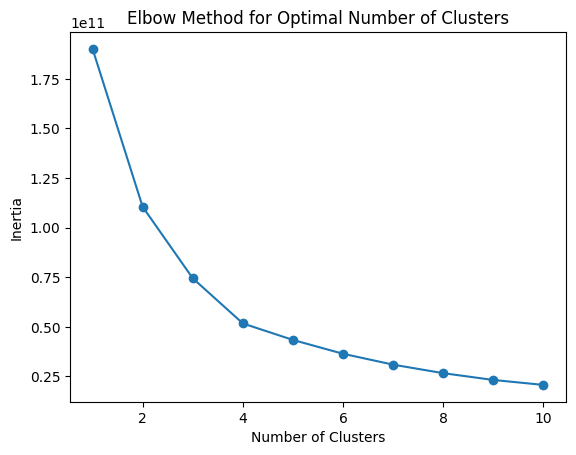

In [34]:
# Conducting PCA to reduce the dimensions to 2
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(images.reshape(num_samples, height * width * channels))

# Determine the optimal number of clusters using the K-Means++ method
inertia = []
for n_clusters in range(1, 11):  # You can adjust the range as needed
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=0)
    kmeans.fit(X_reduced)
    inertia.append(kmeans.inertia_)

# Plot the elbow method to determine the optimal number of clusters
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

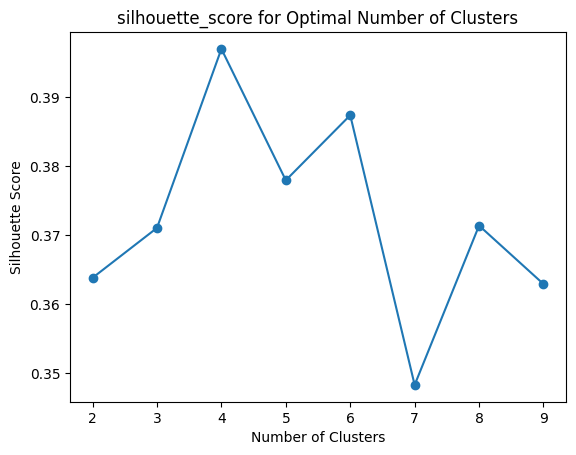

In [35]:
# Determining the number of optimum clusters using silhouette_score
sil_coeff = []
for n_clusters in range(2, 10):  # You can adjust the range as needed
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=0)
    kmeans.fit(X_reduced)
    sil_coeff.append(silhouette_score(X_reduced, kmeans.labels_))

# Plot the silhouette_score to determine the optimal number of clusters
plt.plot(range(2, 10), sil_coeff, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('silhouette_score for Optimal Number of Clusters')
plt.show()

<H2> Based on the above graphs, the optimum number of clusters obtained from 'K-means++' is 4, as it has the highest Silhouette_Score, compared to other clusters.</H2>

In [36]:
# Based on the above graphs, we choose the optimal number of clusters
optimal_n_clusters = 4  # Adjust this based on the plot

# Apply K-Means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_n_clusters, init='k-means++', random_state=0)
kmeans.fit(X_reduced)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
print (f"The centroids are -\n {centroids}")

The centroids are -
 [[-2.13866425e+04 -5.07319306e+02]
 [ 2.78742948e+04 -5.41721016e+03]
 [ 4.36093046e+00 -1.18142002e+04]
 [ 4.02660546e+03  1.57393976e+04]]


<H2>(B) Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question 3  (I, M and S). </H2>

In [37]:
# Defining functions to plot decision boundaries, centroids, and data
def plot_data(X, cat, c="viridis"):
    for c in sorted(set(cat)):
        cat_img = X[np.array(cat) == c]
        plt.scatter(cat_img[:, 0], cat_img[:, 1], cmap=c, s=10, label="Category " + c)
    plt.legend(loc='best', fontsize=10)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, cat, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X, cat, c="viridis")
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)


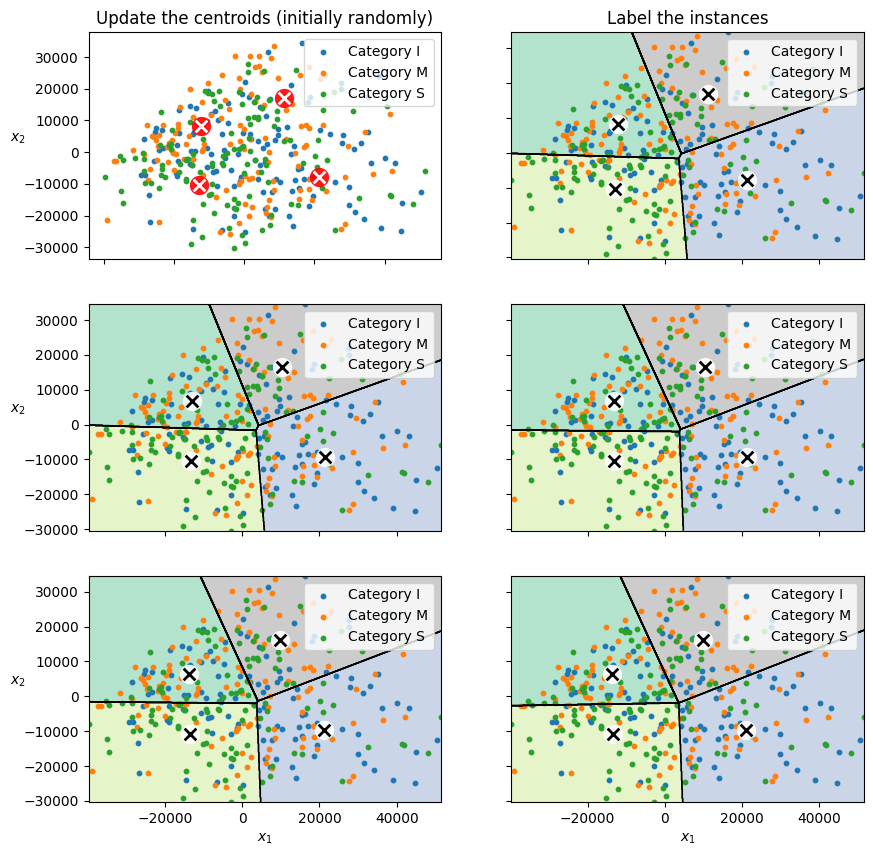

In [38]:
# Running 'k-means++' Clustering through many iteration
kmeans_iter1 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=1,
                      random_state=5)
kmeans_iter2 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=2,
                      random_state=5)
kmeans_iter3 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=3,
                      random_state=5)
kmeans_iter1.fit(X_reduced)
kmeans_iter2.fit(X_reduced)
kmeans_iter3.fit(X_reduced)

plt.figure(figsize=(10, 10))

plt.subplot(321)
plot_data(X_reduced, categories)
plot_centroids(kmeans_iter1.cluster_centers_, circle_color='r', cross_color='w')
plt.ylabel("$x_2$", rotation=0)
plt.tick_params(labelbottom=False)
plt.title("Update the centroids (initially randomly)")

plt.subplot(322)
plot_decision_boundaries(kmeans_iter1, X_reduced, categories, show_xlabels=False,
                         show_ylabels=False)
plt.title("Label the instances")

plt.subplot(323)
plot_decision_boundaries(kmeans_iter1, X_reduced, categories, show_centroids=False,
                         show_xlabels=False)
plot_centroids(kmeans_iter2.cluster_centers_)

plt.subplot(324)
plot_decision_boundaries(kmeans_iter2, X_reduced, categories, show_xlabels=False,
                         show_ylabels=False)

plt.subplot(325)
plot_decision_boundaries(kmeans_iter2, X_reduced, categories, show_centroids=False)
plot_centroids(kmeans_iter3.cluster_centers_)

plt.subplot(326)
plot_decision_boundaries(kmeans_iter3, X_reduced, categories, show_ylabels=False)

#save_fig("kmeans_algorithm_plot")
plt.show()

<H2> The above graphs check whether the data point change clusters with multiple iterations, for the optimum number of clusters. It can be seen that though the centroid location changes minutely, the data clustering does not change significantly.</H2>


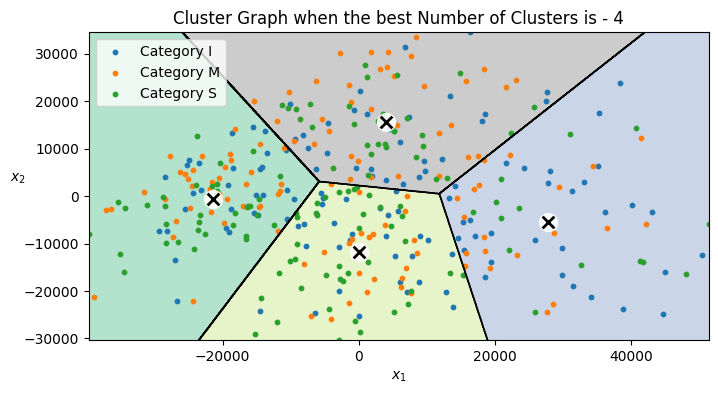

In [39]:
# Plotting the best Clustering Graph
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, X_reduced, categories)
plt.title(f"Cluster Graph when the best Number of Clusters is - {optimal_n_clusters}")
plt.show()


<H1>Question 6</H1>

<H2>Cluster the 360 images using EM.</H2>

<H2>(A) Same as in the previous question, to speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.</H2>

In [40]:
# Conducting PCA to reduce the dimensions to 2
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(images.reshape(num_samples, height * width * channels))
print(f"Original Image shape = {images.shape}")
print(f"Reduced Size = {X_reduced.shape}")


Original Image shape = (360, 400, 400, 3)
Reduced Size = (360, 2)


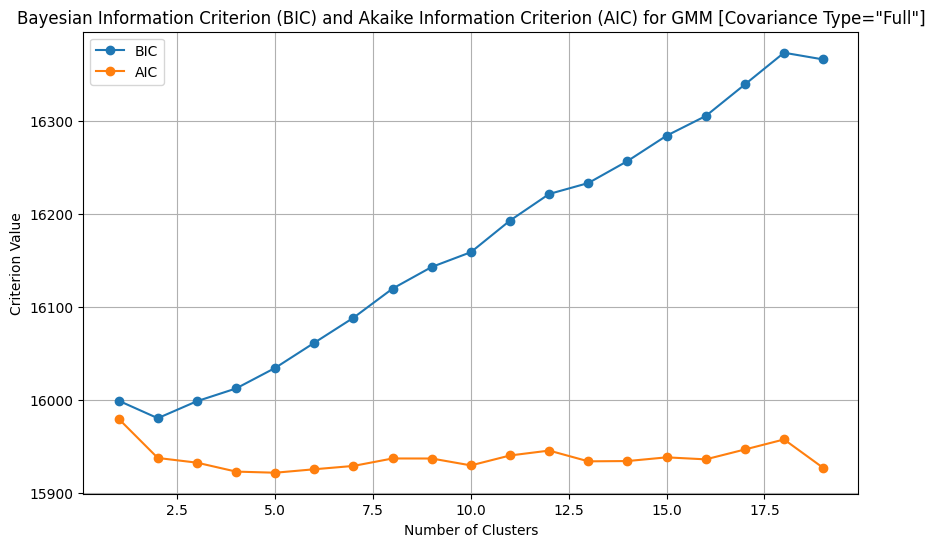

The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - 2
The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - 2


In [41]:
#Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

# Covariance Type = "full"
for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="full", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM [Covariance Type="Full"]')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - {optimal_bic_n_components}")

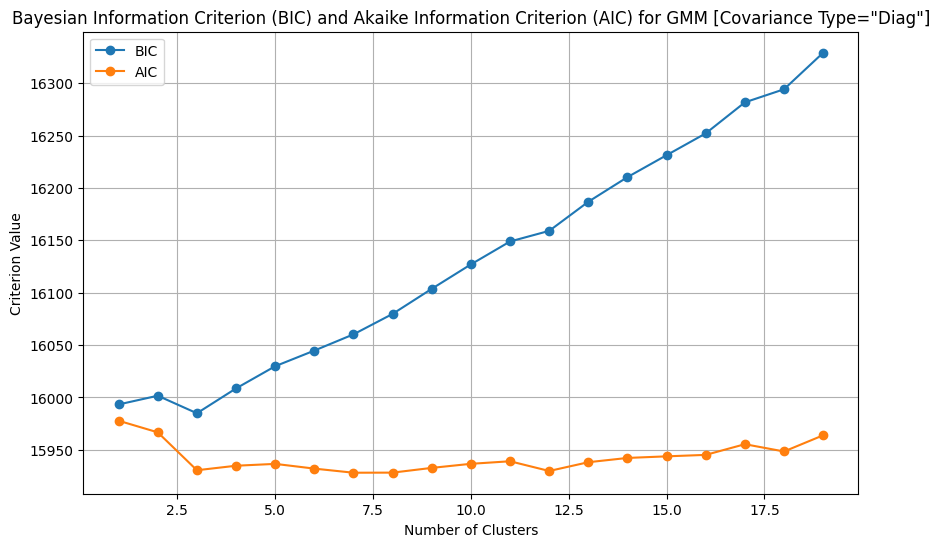

The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to BIC values is - 3
The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to AIC values is - 3


In [42]:
# Covariance Type = "diag"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="diag", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM [Covariance Type="Diag"]')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to AIC values is - {optimal_bic_n_components}")

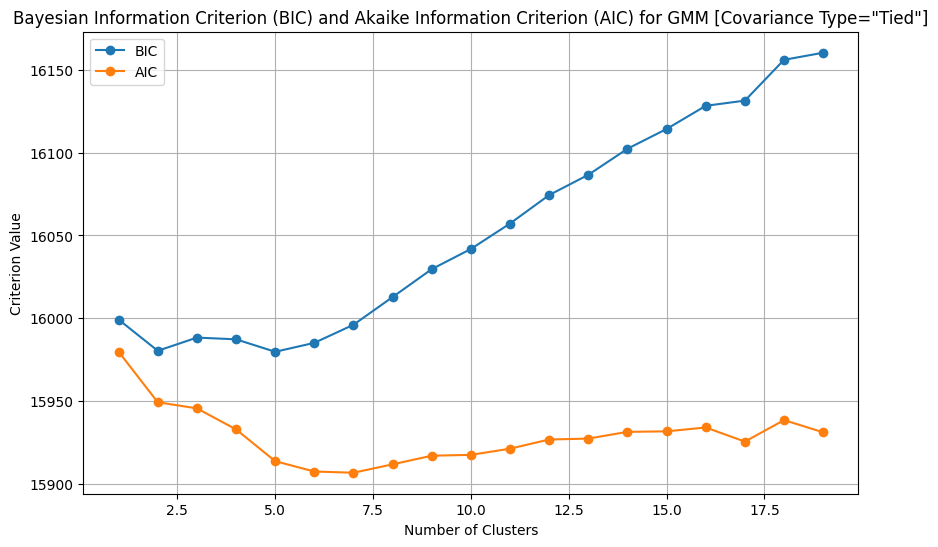

The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to BIC values is - 5
The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to AIC values is - 5


In [43]:
# Covariance Type = "tied"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="tied", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM [Covariance Type="Tied"]')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to AIC values is - {optimal_bic_n_components}")

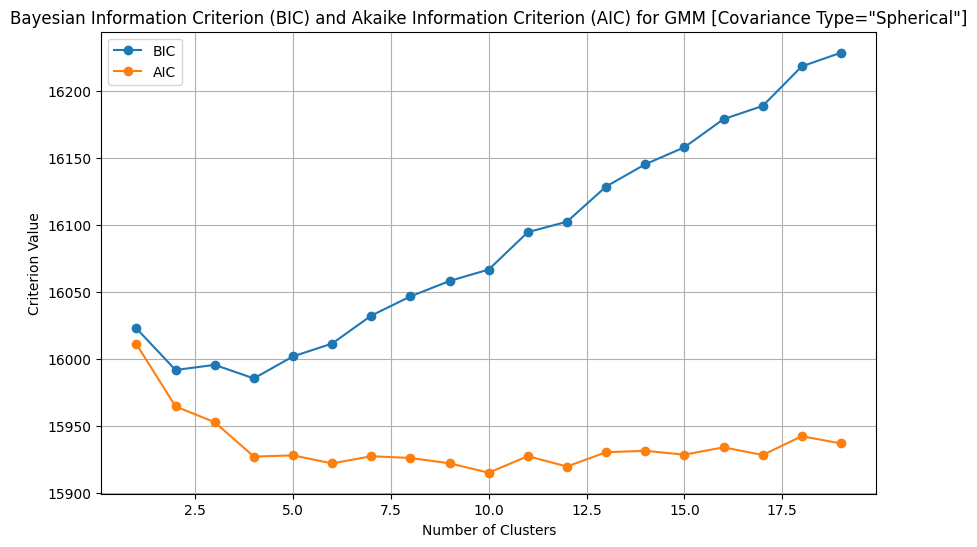

The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - 4
The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - 4


In [44]:
# Covariance Type = "spherical"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="spherical", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM [Covariance Type="Spherical"]')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - {optimal_bic_n_components}")

<H2> Based on the above BIC & AIC graphs, we can see that the optimum number of clusters obtained for different Gaussian Mixture models are -

1. with covariance_type="full" = 2
2. with covariance_type="diag" = 3
3. with covariance_type="tied" = 5
4. with covariance_type="spherical" = 4
</H2>

<H2>(B) Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question 3  (I, M and S). </H2>

In [45]:
# Defining dunctions to plot Gaussian Mixtures
from matplotlib.colors import LogNorm

def plot_gaussian_mixture(clusterer, X, cat, resolution=1000, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z,
                 norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12))
    plt.contour(xx, yy, Z,
                norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12),
                linewidths=1, colors='k')

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z,
                linewidths=2, colors='r', linestyles='dashed')

    for c in sorted(set(cat)):
        cat_img = X[np.array(cat)==c]
        plt.scatter(cat_img[:, 0], cat_img[:, 1], cmap = c, s=7, label = "Category "+c)
    plot_centroids(clusterer.means_, clusterer.weights_)
    plt.legend(loc='best', fontsize=10)

    plt.xlabel("$x_1$")
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)

plt.figure(figsize=(8, 4))

# # Plotting the graph
# plot_gaussian_mixture(GMM, X_reduced, categories)
# plt.show()

<Figure size 800x400 with 0 Axes>

<Figure size 800x400 with 0 Axes>

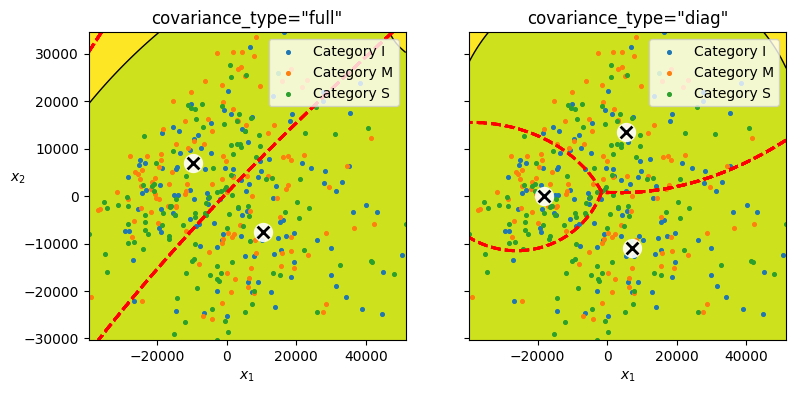

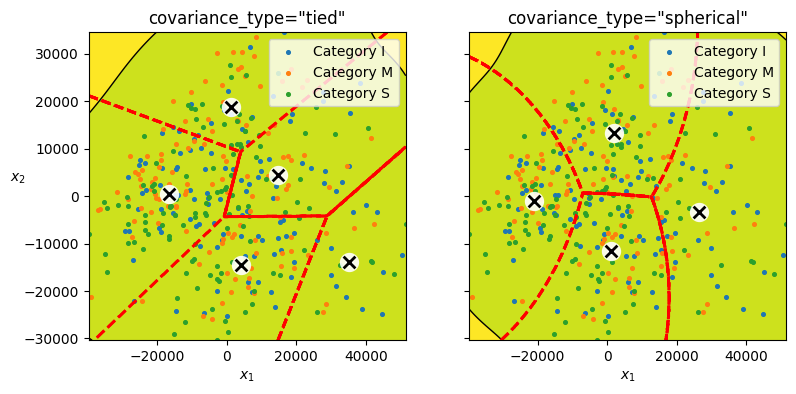

In [46]:
# Plotting Different GM covariance plots
gm_full = GaussianMixture(n_components=2, n_init=10,
                          covariance_type="full", random_state=42)
gm_tied = GaussianMixture(n_components=5, n_init=10,
                          covariance_type="tied", random_state=42)
gm_spherical = GaussianMixture(n_components=4, n_init=10,
                               covariance_type="spherical", random_state=42)
gm_diag = GaussianMixture(n_components=3, n_init=10,
                          covariance_type="diag", random_state=42)
gm_full.fit(X_reduced)
gm_tied.fit(X_reduced)
gm_spherical.fit(X_reduced)
gm_diag.fit(X_reduced)

def compare_gaussian_mixtures(gm1, gm2, X_reduced, categories):
    plt.figure(figsize=(9, 4))

    plt.subplot(121)
    plot_gaussian_mixture(gm1, X_reduced, categories)
    plt.title(f'covariance_type="{gm1.covariance_type}"')

    plt.subplot(122)
    plot_gaussian_mixture(gm2, X_reduced, categories, show_ylabels=False)
    plt.title(f'covariance_type="{gm2.covariance_type}"')

compare_gaussian_mixtures(gm_full, gm_diag, X_reduced, categories)
compare_gaussian_mixtures(gm_tied, gm_spherical, X_reduced, categories)

plt.show()

<H2>

1. From the above graph we can observe that the clustering outcome do not really change based on the 'covariance_type'.
  - Though the number of clusters change, they do not produce a cluster that is distinctly better.
  - Since the clusters are not better, we choose the covariance_type='full' with optimum clusters=2 to generate samples in the following question.
2. Neither Kmeans or EM graphs produce good clustering as a total of 67% total variance is lost while using PCA to reduce the data dimensions to 2 principle componentes.
</H2>

<H2>(C) Use the model to generate 20 new rocks (using the sample() method), and visualize them in the original image space (since you used PCA, you will need to use its inverse_transform() method).</H2>

In [47]:
# Running the Gaussian Mixture with the Optimum Clusters
GMM = GaussianMixture(n_components=2, n_init=10, covariance_type="full", random_state=0)
GMM.fit(X_reduced)

# Using the Sample method to generate 20 images
n_samples = 20
sample_20, sample_y = GMM.sample(n_samples)
sample_20


array([[ -6019.34721949,   6595.55512525],
       [ 45318.21228228,  16023.57142949],
       [ 19646.01506923,  17383.525803  ],
       [ -9621.88696488, -17989.1292788 ],
       [-35243.88420598,  -5656.86653711],
       [   802.53690498,  -3046.65190793],
       [  9918.63587733,   8662.05025961],
       [ 16065.09908186,  -2997.1030983 ],
       [ 25696.6879558 ,    419.71188133],
       [  8150.47993105,   -165.25272346],
       [ 13851.40280128,  18493.20573744],
       [-12870.89455622,  18349.79645165],
       [ -5372.25007512,  10393.94949883],
       [-35957.51507565,   2132.10324588],
       [-17941.8415097 ,   2385.1441673 ],
       [ -1083.36432998,  25648.78847138],
       [-31340.12600077, -13643.89858636],
       [-10051.01453935,   2452.43020568],
       [  2249.29243248,  21173.56383793],
       [ -1140.60414295,   5947.28217113]])

In [48]:
# Inversing the Sample Images extracted to the original size
X_recovered = pca.inverse_transform(sample_20)
X_recovered = X_recovered.reshape(n_samples, 400, 400, 3)
print(f"Recovered Size = {X_recovered.shape}")

Recovered Size = (20, 400, 400, 3)


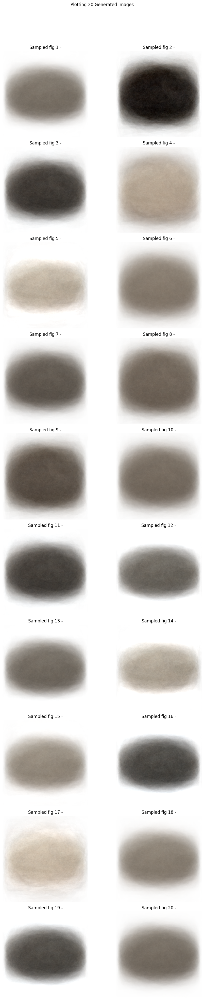

In [49]:
# Visualizing the Generated Images

num_images_to_plot = len(X_recovered)

# Determining the number of rows and columns dynamically
rows = int(math.ceil(num_images_to_plot / 2))
cols = 2

#Adjusting individual image sizes in the plot
image_size = 4

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(rows, cols, figsize=(10, rows*4))

# Plotting the reconstructed images generated by GMM
a = 0
for i in range(rows):
    for j in range(cols):
        if a < num_images_to_plot:
            reconstructed_image = X_recovered[a].reshape(400, 400, 3)
            axes[i,j].imshow(reconstructed_image.astype(int), extent=[0, image_size, 0, image_size])
            axes[i,j].set_title(f"Sampled fig {a+1} -")
            axes[i,j].axis("off")
            a = a + 1
        else:
            axes[i, j].axis("off")

plt.suptitle("Plotting 20 Generated Images")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


<H1>Question 7</H1>

<H2>Build a feedforward neural network (using dense and/or CNN layers) with a few hidden layers (we suggest using Keras (within Tensorflow) or Pytorch). Train the network to classify on 360 rock images using rock name as the label - the category is indicated by the first letter in the filename (I, M and S). Use images from '120 Rocks' folder as your validation data. Choose the number of neurons you find appropriate and efficient (so you have enough time to run it), but make the last layer before the softmax should consist of 8 neurons. The hidden layers should have ReLU activation function. Train the network for multiple epochs until it converges (if the process is too slow, tweak the learning rate and consider simplifying your network). We will not deduct points based on the simplicity of your network, but we expect you to have performance that is above chance performance that could be obtained with an untrained network - in other words, we expect to see train and validation loss decrease and accuracy increase throughout the training. We recommend using Colab (the free version should be totally fine), but make sure to run it with a GPU to speed up the training - to add a GPU on Colab go to Edit->Notebook settings).</H2>

In [52]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import layers, models, optimizers
import time
from tensorflow.keras.layers import BatchNormalization

train_data_dir = '/content/extracted_images/'
valid_data_dir = '/content/drive/MyDrive/Colab Notebooks/120 Rocks/'

batch_size = 32
epochs = 50
learning_rate = 0.0001 #0.0001

# Custom data generator
class CustomDataGenerator(keras.utils.Sequence):
    def __init__(self, data_dir, batch_size, input_shape, shuffle=True):
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.input_shape = input_shape
        self.shuffle = shuffle

        # Get a list of all image files in the data directory
        self.image_files = [f for f in os.listdir(data_dir) if f.endswith('.jpg')]

        self.indices = np.arange(len(self.image_files))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __len__(self):
        return int(np.ceil(len(self.indices) / self.batch_size))

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

        X = np.zeros((len(batch_indices), *self.input_shape))
        y = []

        for i, idx in enumerate(batch_indices):
            image_path = os.path.join(self.data_dir, self.image_files[idx])
            image = tf.keras.preprocessing.image.load_img(image_path, target_size=self.input_shape)
            image = tf.keras.preprocessing.image.img_to_array(image)
            image = image / 255.0  # Normalize pixel values to [0, 1]
            X[i] = image

            # Extract the class label from the image filename (e.g., "I_image1.jpg" -> "I")
            class_label = self.image_files[idx].split('_')[0]
            y.append(class_label)

        # Convert class labels to unique integers
        unique_labels = list(set(y))
        print(unique_labels)
        label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
        y = [label_mapping[label] for label in y]

        return X, keras.utils.to_categorical(y, num_classes=3)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# Define input shape
input_shape = (400, 400, 3)  # Adjust to match your image dimensions

# Create custom data generators
train_generator = CustomDataGenerator(train_data_dir, batch_size, input_shape)
validation_generator = CustomDataGenerator(valid_data_dir, batch_size, input_shape, shuffle=False)

In [53]:
# Buildin the Sequential model
# model = models.Sequential()
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape =[400,400,3]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(100,activation="relu",kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(50,activation="relu",kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(8,activation="relu",name="intermediate_layer"),
    tf.keras.layers.Dense(3,activation="softmax")
])

# Compiling the model
model.compile(
    optimizer=optimizers.Adam(learning_rate),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

start_time = time.time()

# Training the model
history = model.fit(
    train_generator,
    epochs=epochs,
    steps_per_epoch=len(train_generator),
    validation_data=validation_generator,  # Include validation data
    validation_steps=len(validation_generator)  # Number of validation steps
)

# Record the end time
end_time = time.time()

# Evaluate the model on validation data
val_loss, val_accuracy = model.evaluate(validation_generator)
print(f'Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}')

['I', 'M', 'S']
Epoch 1/50
['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
12/12 [==============================] - ETA: 0s - loss: 3.9565 - accuracy: 0.4028['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
12/12 [==============================] - 15s 538ms/step - loss: 3.9565 - accuracy: 0.4028 - val_loss: 5.2359 - val_accuracy: 0.3417
Epoch 2/50
['I', 'M', 'S']
10/12 [========================>.....] - ETA: 0s - loss: 3.5824 - accuracy: 0.5906['I', 'M', 'S']
['M', 'S']
11/12 [==========================>...] - ETA: 0s - loss: 3.5760 - accuracy: 0.5909['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
12/12 [==============================] - 6s 499ms/step - loss: 3.5945 - accuracy: 0.5806 - val_loss: 4.3229 - val_accuracy: 0.3583
Epoch 3/50
['I', 'M', 'S']
12/12 [==============================] - ETA: 0s - loss: 3.4669 - accuracy: 0.6472['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
['I', 'M', 'S']
12/12 [==============================] - 5s 4

<H2> (A) Report the training time (use code to do this). </H2>

In [54]:
# Calculating and reporting the training time
training_time_seconds = end_time - start_time
print(f"The time it took to train the model (in seconds) is: {training_time_seconds:.2f} seconds")

The time it took to train the model (in seconds) is: 325.24 seconds


<H2>(B) Plot training and validation loss and accuracy as a function of training epochs. </H2>

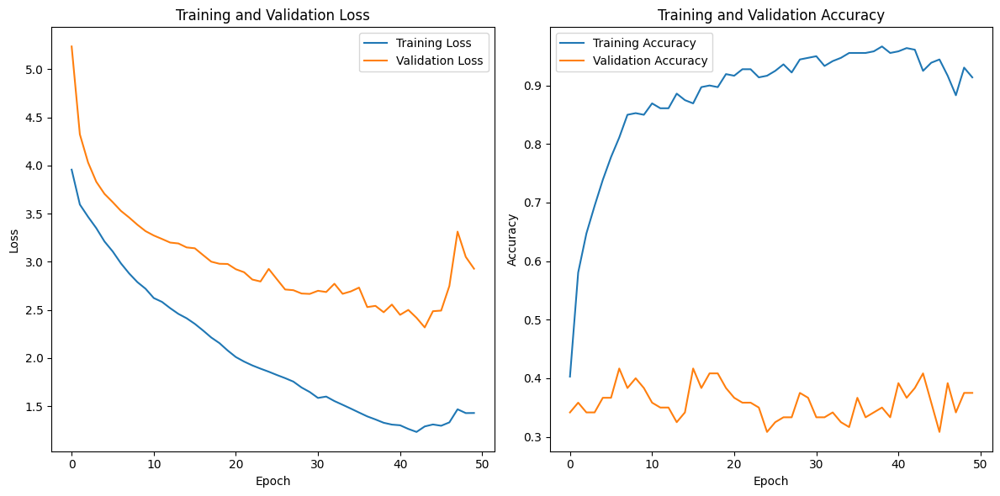

In [55]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

<H1> Answer - </H1>
<H2>

1. As seen from the graphs above -

  - The training and validation loss decreases as more epochs are trained.
  - The training and validation accuracy of the model increases as more models are trained.
  
2. As seen from the above graph, the model substantially overfits the data. Overfitting could be resolved by using aditional data to train the model.
</H2>

<H2>(C) How many parameters does the network have? How many of those parameters are bias parameters?</H2>

In [56]:
model.summary()
print("="*100)

total_parameters = model.count_params()
print(f'\nTotal number of parameters: {total_parameters}')

# Extracting and displaying total bias parameters
total_bias_parameters = 0
for layer in model.layers:
    if hasattr(layer, 'get_weights'):
        weights = layer.get_weights()
        if len(weights) > 1:  # Check if the layer has bias parameters
            total_bias_parameters += weights[1].size

print(f"Total number of Bias Parameters: {total_bias_parameters}")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 480000)            0         
                                                                 
 batch_normalization (Batch  (None, 480000)            1920000   
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 100)               48000100  
                                                                 
 batch_normalization_1 (Bat  (None, 100)               400       
 chNormalization)                                                
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 batch_normalization_2 (Bat  (None, 50)                2

In [57]:
# Displaying the number of Bias Parameters per layer
from tensorflow.keras.models import load_model

print(f"For every layer the model has the following bias parameters - ")
# Iterate through layers and print bias parameters
for layer in model.layers:
    if hasattr(layer, 'get_weights') and len(layer.get_weights()) > 0:
        all_weights = layer.get_weights()
        biases = all_weights[-1]  # Last element is assumed to be biases

        if biases is not None:
            print(f'\tLayer: {layer.name}, Bias parameters: {biases.shape[0]}')

For every layer the model has the following bias parameters - 
	Layer: batch_normalization, Bias parameters: 480000
	Layer: dense, Bias parameters: 100
	Layer: batch_normalization_1, Bias parameters: 100
	Layer: dense_1, Bias parameters: 50
	Layer: batch_normalization_2, Bias parameters: 50
	Layer: intermediate_layer, Bias parameters: 8
	Layer: dense_2, Bias parameters: 3


<H2>(D) Compare the activity of neurons in the next to the last layer (the one with 8 neurons) with the human data. (to get human data use mds_360.txt and mds_120.txt files). Similar to before, use Procrustes analysis to do the comparison.  For training and validation data (separately), report disparity and compute the correlation coefficient between each dimension of mtx1 and mtx2. Display results in a table. </H2>

In [58]:
import numpy as np
from scipy.spatial import procrustes
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform

# Load human data
mds_360 = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/mds_360.txt')
mds_120 = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/mds_120.txt')

# Function to extract activations
def extract_activations(data_generator):
    activations = []
    for batch in data_generator:
        X_batch, _ = batch
        layer_output = model.layers[-2].output  # Assuming the layer is the second-to-last layer
        intermediate_model = Model(inputs=model.input, outputs=layer_output)
        batch_activations = intermediate_model.predict(X_batch)
        activations.append(batch_activations)
    return np.concatenate(activations, axis=0)

# Extract activations for training and validation data
train_activations = extract_activations(train_generator)
valid_activations = extract_activations(validation_generator)

# Flatten the activations for Procrustes analysis
train_activations_flat = train_activations.reshape(train_activations.shape[0], -1)
valid_activations_flat = valid_activations.reshape(valid_activations.shape[0], -1)

# Standardize the data
scaler = StandardScaler()
train_activations_scaled = scaler.fit_transform(train_activations_flat)
valid_activations_scaled = scaler.transform(valid_activations_flat)

# Perform Procrustes analysis for training data
mtx1, mtx2, disparity = procrustes(mds_360, train_activations_scaled)

mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(train_activations_scaled,columns = hd)

correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between training data (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & training data is - ")
print(df)



# # Compute correlation coefficients
# # correlations_train = np.corrcoef(mtx1.T, mtx2.T)[:mds_360.shape[1], mds_360.shape[1]:]
# correlations_train = np.corrcoef(mtx1.T, mtx2.T)[:mtx1.shape[1], mtx1.shape[1]:]  # PLEASE DOUBLE CHECK


# # Display results for training data
# print("Training Data Results:")
# print(f"Disparity: {disparity}")
# print("Correlation Coefficients:")
# print(correlations_train)

# Perform Procrustes analysis for validation data
mtx1_valid, mtx2_valid, disparity_valid = procrustes(mds_120, valid_activations_scaled)


mtx1 = pd.DataFrame(human_data, columns = hd)
mtx2 = pd.DataFrame(valid_activations_scaled,columns = hd)

correlations = mtx1.corrwith(mtx2).round(4)
df = pd.DataFrame({'Features':correlations.index, 'Correlation':correlations.values}).round(4)
print(f"\nDisparity between validation data (8 features) to human data is: {disparity.round(4)}")

print("\nThe Correlation between human_data & validation data is - ")
print(df)


# # Compute correlation coefficients for validation data
# correlations_valid = np.corrcoef(mtx1_valid.T, mtx2_valid.T)[:mds_120.shape[1], mds_120.shape[1]:]

# # Display results for validation data
# print("\nValidation Data Results:")
# print(f"Disparity: {disparity_valid}")
# print("Correlation Coefficients:")
# print(correlations_valid)

['I', 'M', 'S']
1/1 [==============================] - 0s 270ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 200ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 179ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 136ms/step
['I', 'M', 'S']


1/1 [==============================] - 0s 141ms/step
['I', 'M', 'S']


1/1 [==============================] - 0s 124ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 138ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 130ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 116ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 115ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 135ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 104ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 141ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 117ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 121ms/step
['I', 'M', 'S']
1/1 [==============================] - 0s 109ms/step

Disparity between training data (8 features) to human data is: 0.9905

The Correlation between human_data & training data is - 
    Features  Correlation
0  Feature 1      -0.0682
1  Feature 2       0.0013
2  Feature 3      -0.0182
3  Feature 4       0.023

<H2>

1. The disparity for the Training Data (0.9851) matches the disparity found previously for PCA (0.9842).

2. The Disparity for Validation Set is (0.9659) is a bit less than the disparity found for training data (0.9851) </H2>